Zadanie 1.

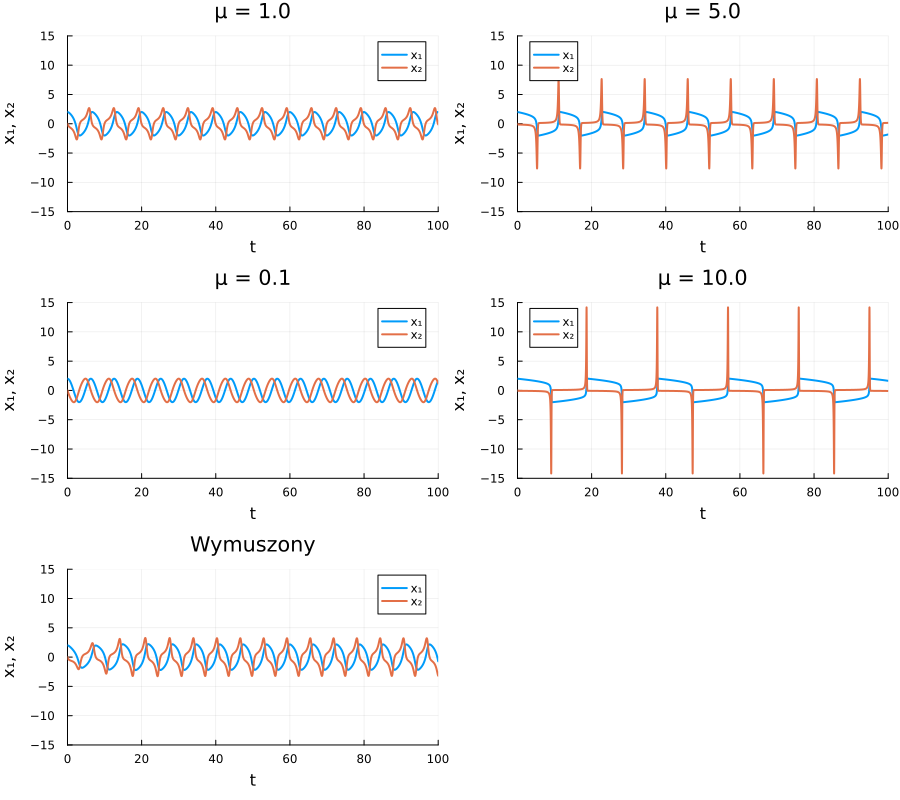

In [8]:
using DifferentialEquations
using Plots

# Przedłużony czas symulacji
tspan = (0.0, 100.0)
u0 = [2.0, 0.0]

# Funkcja dla równania van der Pola z parametrem μ
function van_der_pol!(du, u, p, t)
    μ = p
    du[1] = u[2]
    du[2] = μ * (1 - u[1]^2) * u[2] - u[1]
end

# Funkcja do tworzenia wykresu
function plot_van_der_pol(μ, title, ylims)
    prob = ODEProblem(van_der_pol!, u0, tspan, μ)
    sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)
    plot(sol,
        xlabel="t",
        ylabel="x₁, x₂",
        label=["x₁" "x₂"],
        linewidth=2,
        title=title,
        ylims=ylims)
end

# Tworzenie układu wykresów
plots = []

# Określenie wspólnego zakresu osi y
y_range = (-15, 15)

# Przykład 1: Standardowe równanie van der Pola
push!(plots, plot_van_der_pol(1.0, "μ = 1.0", y_range))

# Przykład 2: Zwiększona nieliniowość
push!(plots, plot_van_der_pol(5.0, "μ = 5.0", y_range))

# Przykład 3: Prawie liniowy oscylator
push!(plots, plot_van_der_pol(0.1, "μ = 0.1", y_range))

# Przykład 4: Silnie nieliniowy oscylator
push!(plots, plot_van_der_pol(10.0, "μ = 10.0", y_range))

# Przykład 5: Zmodyfikowane równanie van der Pola z wymuszeniem
function forced_van_der_pol!(du, u, p, t)
    μ, A, ω = p
    du[1] = u[2]
    du[2] = μ * (1 - u[1]^2) * u[2] - u[1] + A * sin(ω * t)
end

forced_prob = ODEProblem(forced_van_der_pol!, u0, tspan, (1.0, 0.5, 1.0)) #  to struktura z pakietu DifferentialEquations.jl, która definiuje problem równania różniczkowego zwyczajnego (ODE - Ordinary Differential Equation). Przyjmuje ona kilka argumentów

forced_sol = solve(forced_prob, Tsit5(), reltol=1e-8, abstol=1e-8) # Funkcja solve jest używana do numerycznego rozwiązania zdefiniowanego problemu ODE

push!(plots, plot(forced_sol,
    xlabel="t",
    ylabel="x₁, x₂",
    label=["x₁" "x₂"],
    linewidth=2,
    title="Wymuszony",
    ylims=y_range))

# Wyświetlenie wszystkich wykresów obok siebie
plot(plots..., layout=(3, 2), size=(900, 800))

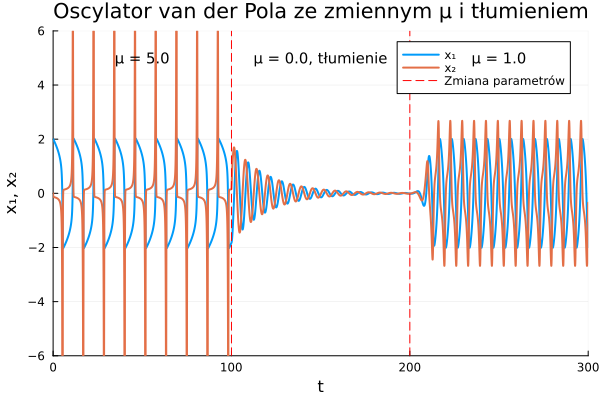

In [10]:
using DifferentialEquations
using Plots

# Przedłużony czas symulacji
tspan = (0.0, 300.0)
u0 = [2.0, 0.0]

# Funkcja dla równania van der Pola z zmiennym μ i dodatkowym tłumieniem
function variable_van_der_pol!(du, u, p, t)
  if t < 100
    μ = 5.0  # Silne oscylacje
    damping = 0.0
  elseif t < 200
    μ = 0.0  # Brak nieliniowości
    damping = 0.1  # Dodatkowe tłumienie liniowe
  else
    μ = 1.0  # Umiarkowane oscylacje
    damping = 0.0
  end

  du[1] = u[2]
  du[2] = μ * (1 - u[1]^2) * u[2] - u[1] - damping * u[2]
end

# Rozwiązanie równania
prob = ODEProblem(variable_van_der_pol!, u0, tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

# Wizualizacja wyników
plot(sol,
  xlabel="t",
  ylabel="x₁, x₂",
  label=["x₁" "x₂"],
  linewidth=2,
  title="Oscylator van der Pola ze zmiennym μ i tłumieniem",
  ylims=(-6, 6))

# Dodanie linii pionowych oznaczających zmiany μ
vline!([100, 200], color=:red, linestyle=:dash, label="Zmiana parametrów")

# Dodanie adnotacji
annotate!(50, 5, text("μ = 5.0", :black, 10))
annotate!(150, 5, text("μ = 0.0, tłumienie", :black, 10))
annotate!(250, 5, text("μ = 1.0", :black, 10))

Zadanie 2 

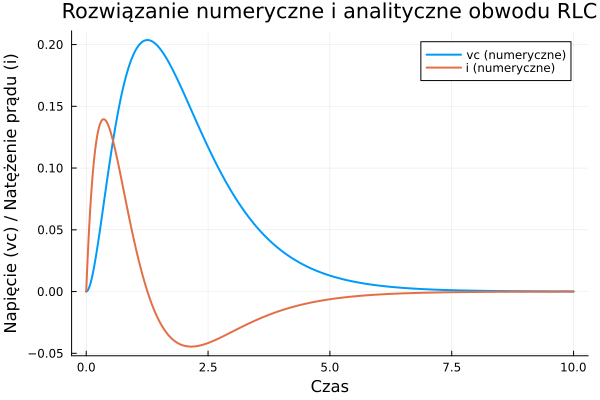

In [22]:
using DifferentialEquations
using Plots

# Parametry obwodu
R = 3.0 # Reprezentuje opór elektryczny w obwodzie. Odpowiada za rozpraszanie energii w postaci ciepła.
L = 1.0 # Reprezentuje cewkę w obwodzie. Cewka magazynuje energię w polu magnetycznym i przeciwdziała zmianom prądu.
C = 1 / 2 #  Reprezentuje kondensator w obwodzie. Kondensator magazynuje energię w polu elektrycznym i przeciwdziała zmianom napięcia.

# Funkcja opisująca układ równań różniczkowych
function rlc_circuit!(du, u, p, t)
  vc, i = u
  du[1] = i / C
  du[2] = -(R / L) * i - (1 / L) * vc + (1 / L) * exp(-2t)
end

# Warunki początkowe i przedział czasu
u0 = [0.0, 0.0]  # [vc(0), i(0)]
tspan = (0.0, 20.0)

# Rozwiązanie numeryczne
prob = ODEProblem(rlc_circuit!, u0, tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

# Funkcje dla rozwiązania analitycznego
vc_analytic(t) = 2 * exp(-t) - 2 * (1 + t) * exp(-2t)
i_analytic(t) = -exp(-t) + (1 + 2t) * exp(-2t)

# Przygotowanie danych do wykresu
t = range(0, 10, length=500)
vc_num = [sol(ti)[1] for ti in t]
i_num = [sol(ti)[2] for ti in t]
vc_anal = vc_analytic.(t)
i_anal = i_analytic.(t)

# Tworzenie wykresu
plot(t, vc_num, label="vc (numeryczne)", linewidth=2)
plot!(t, i_num, label="i (numeryczne)", linewidth=2)

xlabel!("Czas")
ylabel!("Napięcie (vc) / Natężenie prądu (i)")
title!("Rozwiązanie numeryczne i analityczne obwodu RLC")

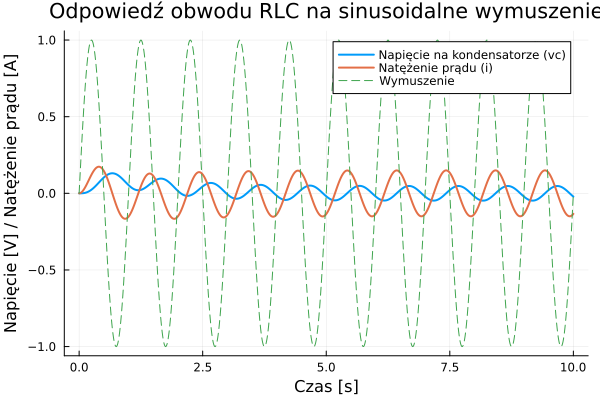

In [23]:
using DifferentialEquations
using Plots

# Parametry obwodu
R = 3.0
L = 1.0
C = 1 / 2

# Parametry wymuszenia
A = 1.0  # Amplituda
ω = 2π  # Częstość kątowa (2π oznacza okres 1 sekundy)

# Funkcja opisująca układ równań różniczkowych z sinusoidalnym wymuszeniem
function rlc_circuit!(du, u, p, t)
  vc, i = u
  du[1] = i / C
  du[2] = -(R / L) * i - (1 / L) * vc + (A / L) * sin(ω * t)
end

# Warunki początkowe i przedział czasu
u0 = [0.0, 0.0]  # [vc(0), i(0)]
tspan = (0.0, 10.0)  # Zwiększamy czas do 10 sekund, aby zobaczyć więcej okresów

# Rozwiązanie numeryczne
prob = ODEProblem(rlc_circuit!, u0, tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

# Przygotowanie danych do wykresu
t = range(0, 10, length=1000)
vc = [sol(ti)[1] for ti in t]
i = [sol(ti)[2] for ti in t]

# Tworzenie wykresu
plot(t, vc, label="Napięcie na kondensatorze (vc)", linewidth=2)
plot!(t, i, label="Natężenie prądu (i)", linewidth=2)
plot!(t, A * sin.(ω * t), label="Wymuszenie", linestyle=:dash)
xlabel!("Czas [s]")
ylabel!("Napięcie [V] / Natężenie prądu [A]")
title!("Odpowiedź obwodu RLC na sinusoidalne wymuszenie")

Zadanie 3. 

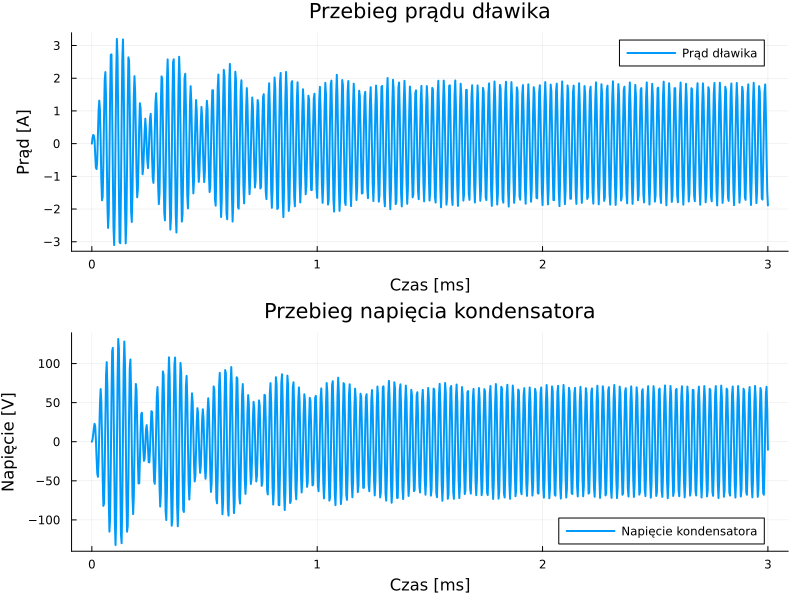

In [25]:
using DifferentialEquations
using Plots

# Parametry układu
L = 197e-6  # Indukcyjność [H]
C = 100e-9  # Pojemność [F]
V0 = 1.96   # Napięcie wyjściowe [V]
Vs = 14     # Amplituda napięcia wejściowego [V]
fs = 40e3   # Częstotliwość przełączania [Hz]
ωs = 2π * fs

# Funkcja sign z histerezą dla stabilności numerycznej
function sgn(x, ε=1e-3)
  return x / sqrt(x^2 + ε^2)
end

# Układ równań różniczkowych
function converter!(du, u, p, t)
  i, v = u
  du[1] = (1 / L) * (-v - V0 * sgn(i) + Vs * sgn(sin(ωs * t)))
  du[2] = (1 / C) * i
end

# Warunki początkowe i przedział czasu
u0 = [0.0, 0.0]  # [i(0), v(0)]
tspan = (0.0, 0.003)

# Rozwiązanie numeryczne
prob = ODEProblem(converter!, u0, tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

# Przygotowanie danych do wykresu
t = range(tspan[1], tspan[2], length=1000)
i_values = [sol(ti)[1] for ti in t]
v_values = [sol(ti)[2] for ti in t]

# Tworzenie wykresu
p1 = plot(t * 1000, i_values, label="Prąd dławika", linewidth=2)
xlabel!("Czas [ms]")
ylabel!("Prąd [A]")
title!("Przebieg prądu dławika")

p2 = plot(t * 1000, v_values, label="Napięcie kondensatora", linewidth=2)
xlabel!("Czas [ms]")
ylabel!("Napięcie [V]")
title!("Przebieg napięcia kondensatora")

plot(p1, p2, layout=(2, 1), size=(800, 600))


Zadanie 4 

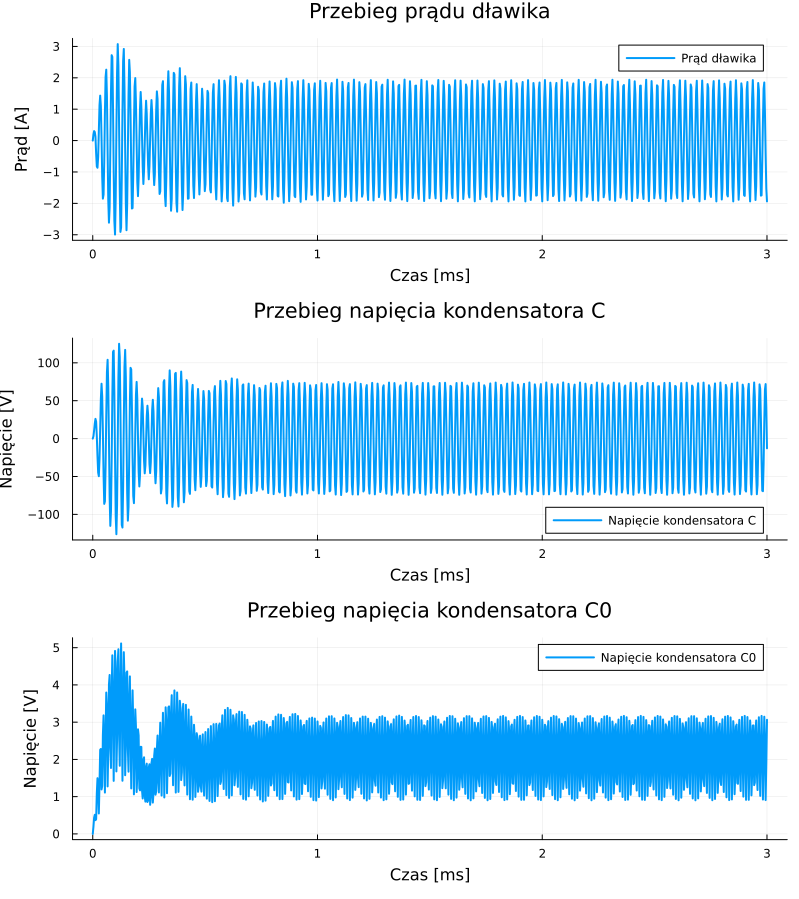

In [27]:
using DifferentialEquations
using Plots

# Parametry układu
L = 197e-6  # Indukcyjność [H]
C = 100e-9  # Pojemność [F]
C0 = 1e-6   # Pojemność obciążenia [F]
R = 1.8     # Rezystancja obciążenia [Ω]
Vs = 14     # Amplituda napięcia wejściowego [V]
fs = 40e3   # Częstotliwość przełączania [Hz]
ωs = 2π * fs

# Funkcja sign z histerezą dla stabilności numerycznej
function sgn(x, ε=1e-3)
  return x / sqrt(x^2 + ε^2)
end

# Układ równań różniczkowych
function converter!(du, u, p, t)
  i, v, v0 = u
  du[1] = (1 / L) * (-v - v0 * sgn(i) + Vs * sgn(sin(ωs * t)))
  du[2] = (1 / C) * i
  du[3] = (1 / C0) * (abs(i) - v0 / R)
end

# Warunki początkowe i przedział czasu
u0 = [0.0, 0.0, 0.0]  # [i(0), v(0), v0(0)]
tspan = (0.0, 0.003)

# Rozwiązanie numeryczne
prob = ODEProblem(converter!, u0, tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

# Przygotowanie danych do wykresu
t = range(tspan[1], tspan[2], length=1000)
i_values = [sol(ti)[1] for ti in t]
v_values = [sol(ti)[2] for ti in t]
v0_values = [sol(ti)[3] for ti in t]

# Tworzenie wykresów
p1 = plot(t * 1000, i_values, label="Prąd dławika", linewidth=2)
xlabel!("Czas [ms]")
ylabel!("Prąd [A]")
title!("Przebieg prądu dławika")

p2 = plot(t * 1000, v_values, label="Napięcie kondensatora C", linewidth=2)
xlabel!("Czas [ms]")
ylabel!("Napięcie [V]")
title!("Przebieg napięcia kondensatora C")

p3 = plot(t * 1000, v0_values, label="Napięcie kondensatora C0", linewidth=2)
xlabel!("Czas [ms]")
ylabel!("Napięcie [V]")
title!("Przebieg napięcia kondensatora C0")

plot(p1, p2, p3, layout=(3, 1), size=(800, 900))

Zadani 5 

In [29]:
using DifferentialEquations
using Plots

# Parametry układu
L = 180e-6  # Indukcyjność [H]
C = 8.5e-6  # Pojemność [F]
R = 9       # Rezystancja obciążenia [Ω]
Vin = 15    # Napięcie wejściowe [V]
Iout = 1    # Prąd wyjściowy [A]
fs = 40e3   # Częstotliwość przełączania [Hz]
ωs = 2π * fs

# Uproszczona wersja (R1 = R2 = R3 = 0)
A = [-1/L 0; 0 -1/(C*R)]
B = [1/L 1/L; -1/(C*R) 0]
b = [-Vin / L; 0]
f = [Vin / L; Iout / (C)]

# Funkcja przełączania
u(t) = 0.5 * (1 - sign(sin(ωs * t)))

# Układ równań różniczkowych
function buck_boost!(dx, x, p, t)
  i, v = x
  dx[1] = A[1, 1] * i + A[1, 2] * v + (B[1, 1] * i + B[1, 2] * v + b[1]) * u(t) + f[1]
  dx[2] = A[2, 1] * i + A[2, 2] * v + (B[2, 1] * i + B[2, 2] * v + b[2]) * u(t) + f[2]
end

# Warunki początkowe i przedział czasu
x0 = [0.0, 0.0]  # [i(0), v(0)]
tspan = (0.0, 0.003)

# Rozwiązanie numeryczne
prob = ODEProblem(buck_boost!, x0, tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)

# Przygotowanie danych do wykresu
t = range(tspan[1], tspan[2], length=1000)
i_values = [sol(ti)[1] for ti in t]
v_values = [sol(ti)[2] for ti in t]

# Tworzenie wykresów
p1 = plot(t * 1000, i_values, label="Prąd dławika", linewidth=2)
xlabel!("Czas [ms]")
ylabel!("Prąd [A]")
title!("Przebieg prądu dławika")

p2 = plot(t * 1000, v_values, label="Napięcie kondensatora", linewidth=2)
xlabel!("Czas [ms]")
ylabel!("Napięcie [V]")
title!("Przebieg napięcia kondensatora")

plot(p1, p2, layout=(2, 1), size=(800, 600))
savefig("buck_boost_waveforms.png")

"f:\\Studia\\studia\\ts\\buck_boost_waveforms.png"

Zadanie 6.

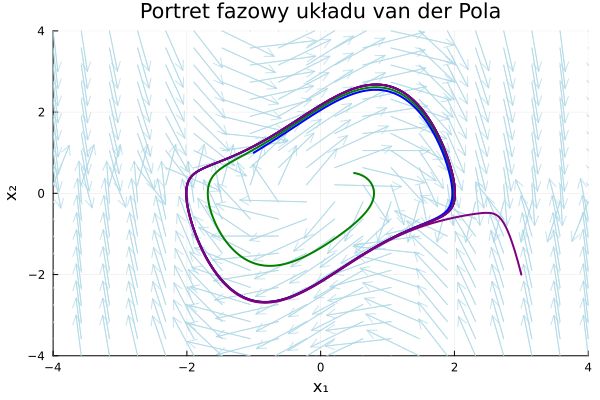

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


"f:\\Studia\\studia\\ts\\van_der_pol_phase_portrait.png"

In [31]:
using DifferentialEquations
using Plots

# Parametry układu van der Pola
μ = 1.0

# Funkcja opisująca układ van der Pola
function van_der_pol!(du, u, p, t)
  du[1] = u[2]
  du[2] = μ * (1 - u[1]^2) * u[2] - u[1]
end

# Funkcja do generowania pola wektorowego
function vector_field(x1, x2)
  dx1 = x2
  dx2 = μ * (1 - x1^2) * x2 - x1
  return [dx1, dx2]
end

# Generowanie siatki dla pola wektorowego
x1_range = range(-4, 4, length=20)
x2_range = range(-4, 4, length=20)
x1_grid = [x1 for x1 in x1_range, x2 in x2_range]
x2_grid = [x2 for x1 in x1_range, x2 in x2_range]

# Obliczanie pola wektorowego
field = [vector_field(x1_grid[i, j], x2_grid[i, j]) for i in 1:size(x1_grid, 1), j in 1:size(x1_grid, 2)]
dx1 = [f[1] for f in field]
dx2 = [f[2] for f in field]

# Normalizacja wektorów
magnitude = sqrt.(dx1 .^ 2 + dx2 .^ 2)
dx1_norm = dx1 ./ magnitude
dx2_norm = dx2 ./ magnitude

# Tworzenie wykresu
p = quiver(x1_grid, x2_grid, quiver=(dx1_norm, dx2_norm),
  color=:lightblue, alpha=0.7, linewidth=1)

# Funkcja do rozwiązywania i rysowania trajektorii
function solve_and_plot!(initial_condition, color)
  tspan = (0.0, 20.0)
  prob = ODEProblem(van_der_pol!, initial_condition, tspan)
  sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)
  plot!(sol, vars=(1, 2), label="", color=color, linewidth=2)
end

# Rozwiązywanie i rysowanie dla różnych warunków początkowych
solve_and_plot!([2.0, 0.0], :red)  # Cykl graniczny
solve_and_plot!([0.5, 0.5], :green)
solve_and_plot!([-1.0, 1.0], :blue)
solve_and_plot!([3.0, -2.0], :purple)

# Ustawienia wykresu
xlabel!("x₁")
ylabel!("x₂")
title!("Portret fazowy układu van der Pola")
xlims!(-4, 4)
ylims!(-4, 4)

# Wyświetlenie wykresu
display(p)

# Zapisanie wykresu
savefig("van_der_pol_phase_portrait.png")